# SIGNAL ANALYSIS

Louis Widi Anandaputra - 22/492218/PA/21090

A music file from each genre would be taken for analysis

In [11]:
import os
import pandas as pd
import numpy as np
import IPython
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt


sns.set_palette("Set2")

## Data Preparation

In [3]:
def listdir_nohidden(path):
    for f in os.listdir(path):
        if not f.startswith('.'):
            yield f

In [4]:
seed = 12
np.random.seed(seed)

hop_length = 512

n_fft = 2048

In [5]:
general_path = './Data/genres_original'
genres = list(listdir_nohidden('Data/genres_original/'))
print(genres)

['pop', 'metal', 'disco', 'blues', 'reggae', 'classical', 'rock', 'hiphop', 'country', 'jazz']


In [6]:
signals = []
for i in genres:
    file = f'{general_path}/{i}/{i}.00050.wav'
    signal , sr = librosa.load(file )
    signals.append(signal)

In [7]:
for i in range(0,len(signals)):
    print(f"-Signal {genres[i]}: {signals[i]}\n")

print(f"\n\nSampling rate: {sr}")

-Signal pop: [0.03704834 0.03735352 0.037323   ... 0.05224609 0.05944824 0.12362671]

-Signal metal: [0.22305298 0.35424805 0.42669678 ... 0.12341309 0.17764282 0.23867798]

-Signal disco: [ 0.1925354   0.03353882 -0.02471924 ... -0.14624023 -0.12200928
 -0.07476807]

-Signal blues: [0.06652832 0.09335327 0.04510498 ... 0.08078003 0.06115723 0.04190063]

-Signal reggae: [ 0.03982544  0.04125977  0.03393555 ... -0.0546875  -0.04458618
 -0.04180908]

-Signal classical: [0.00305176 0.00137329 0.00415039 ... 0.01333618 0.01409912 0.01431274]

-Signal rock: [0.14434814 0.2128601  0.19824219 ... 0.09204102 0.07012939 0.04364014]

-Signal hiphop: [-0.02008057 -0.00167847  0.00997925 ...  0.11227417  0.16308594
  0.13439941]

-Signal country: [ 0.0461731   0.05691528  0.00158691 ... -0.05786133 -0.10861206
 -0.12380981]

-Signal jazz: [-0.13595581 -0.09390259 -0.06210327 ...  0.29577637  0.23522949
  0.2368164 ]



Sampling rate: 22050


## Audio Wave Signal

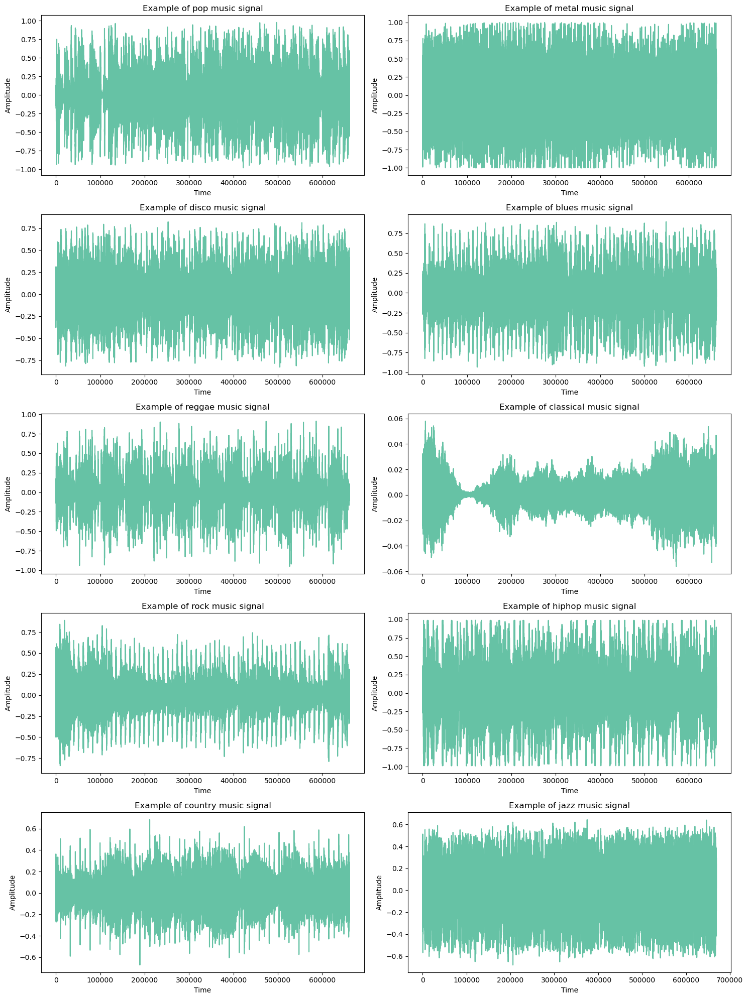

In [8]:
fig, ax = plt.subplots(nrows = 5, ncols = 2, figsize=(15,20))
i = 0
j = 0
for k in range (0, len(signals)):
    sns.lineplot(signals[k], ax = ax[i][j])
    ax[i][j].set_xlabel('Time')
    ax[i][j].set_ylabel('Amplitude')
    ax[i][j].set_title(f"Example of {genres[k]} music signal")
    ax[i][j].ticklabel_format(useOffset=False, style='plain')
    
    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1
plt.tight_layout()
plt.show()

In [9]:
IPython.display.Audio(signals[4], rate=sr)

## Zero Crossing Rates on Each Frames

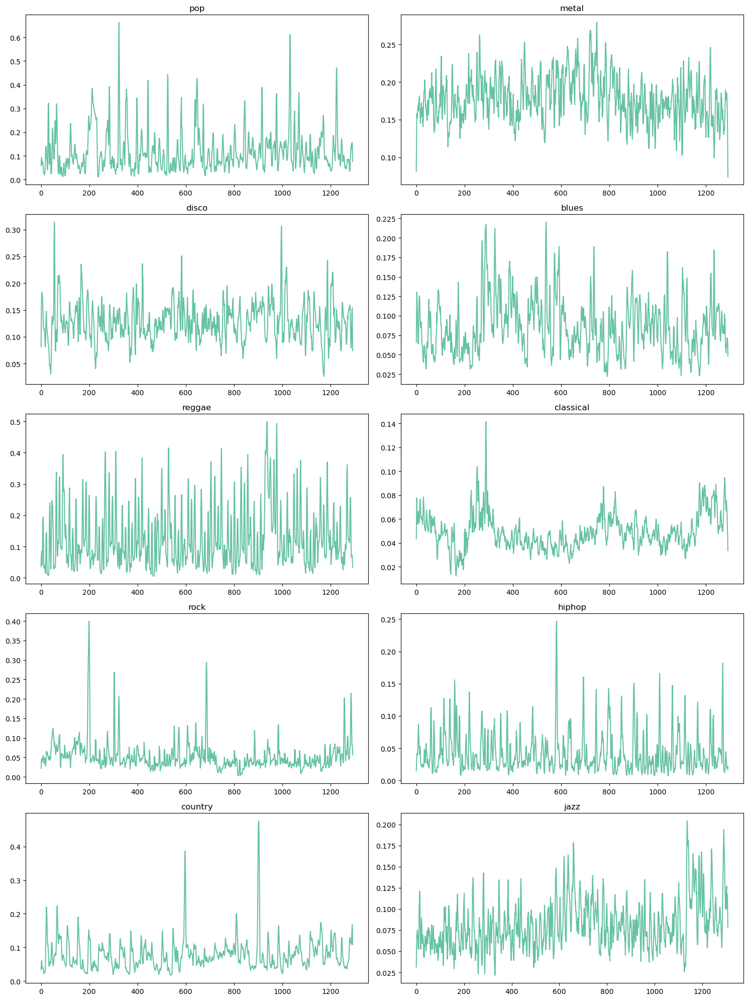

In [10]:
# zero crossing rate
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y = signals[k],hop_length = hop_length)[0]
    
    axes[i][j].plot(zero_crossing_rate)
 
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

# Tempo

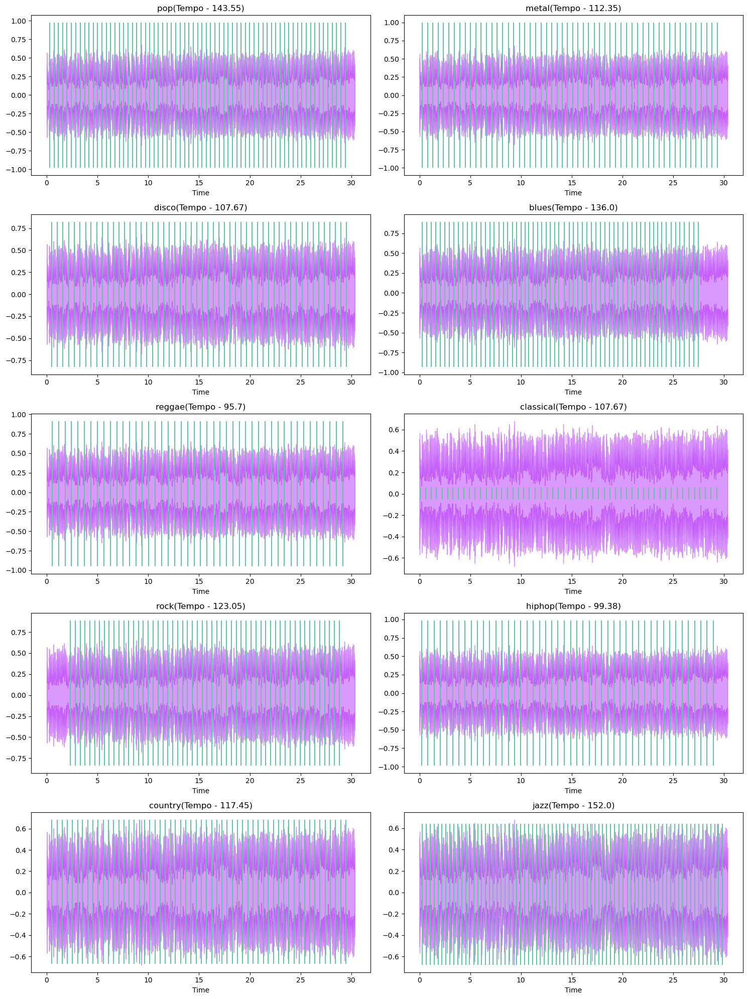

In [12]:
# tempo
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    
    tempo, beat_times = librosa.beat.beat_track(y = signals[k], sr = sr, units='time')

    librosa.display.waveshow(y = signal, sr = sr, color = "#A300F9",alpha = 0.4,ax=axes[i][j])
    
    axes[i][j].vlines(beat_times, np.min(signals[k]), np.max(signals[k]))
    
    axes[i][j].set_title(genres[k] + "(Tempo - " + str(round(tempo,2)) + ")")

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Frequency Domain

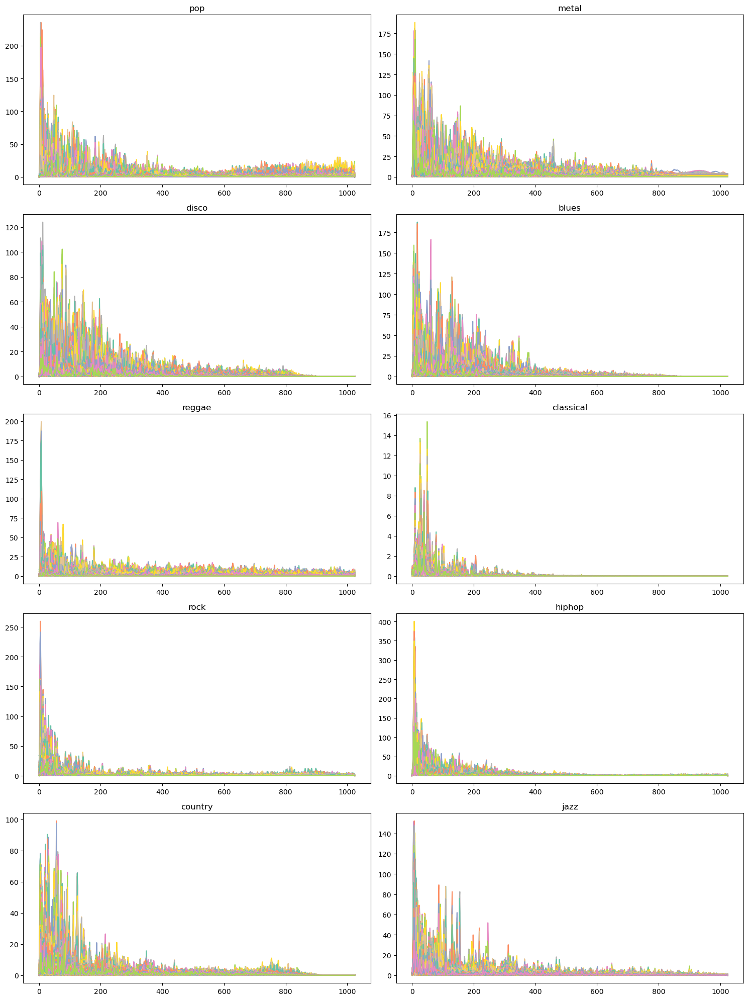

In [13]:
#BANDWITH
fig, axes= plt.subplots(nrows = 5, ncols = 2, figsize =( 15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    
    stft_data = np.abs(librosa.stft(y = signals[k], n_fft = n_fft, hop_length = hop_length))
    
    axes[i][j].plot(stft_data)
 
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Spectogram

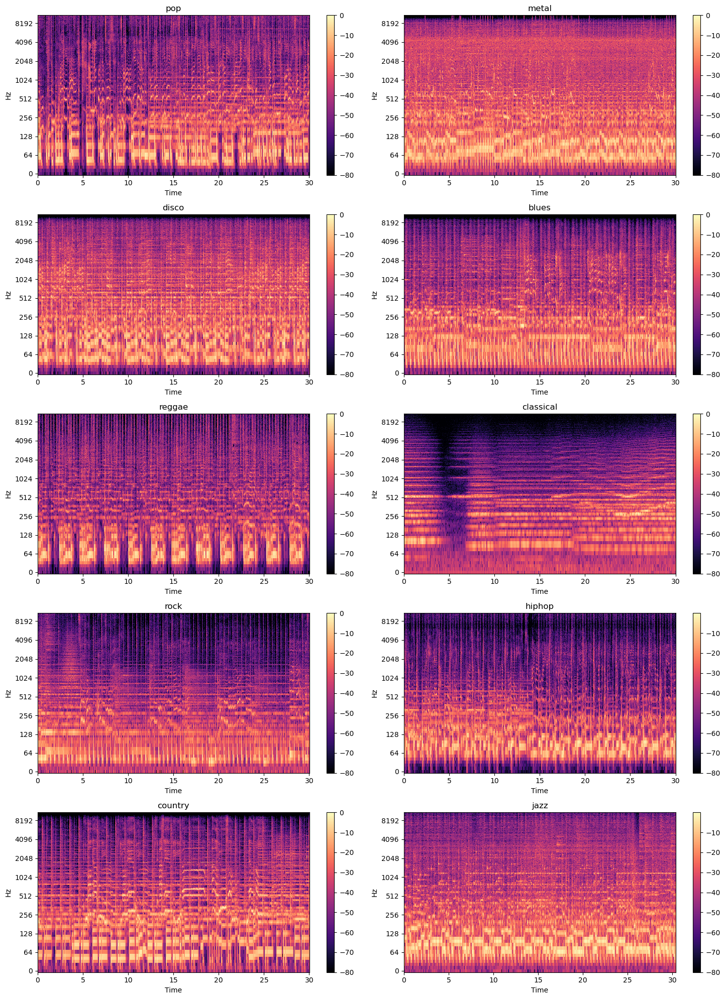

In [14]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    stft_data = np.abs(librosa.stft(y = signals[k], n_fft = n_fft,hop_length = hop_length))
    
    # Convert an amplitude spectrogram to Decibels-scaled spectrogram.
    DB = librosa.amplitude_to_db(stft_data, ref = np.max)

    img = librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',ax=axes[i][j])
    fig.colorbar(img, ax=axes[i][j])
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Mel-Spectogram

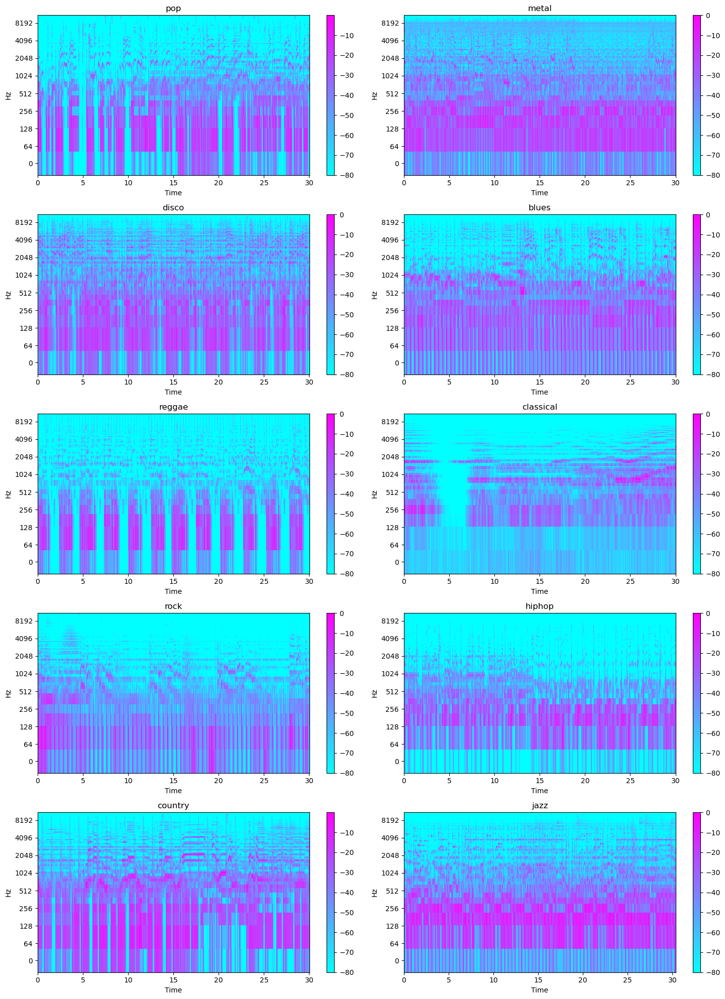

In [13]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    mel_spec = librosa.feature.melspectrogram(y = signals[k], sr = sr, hop_length = hop_length)
    
    mel_spec_db = librosa.amplitude_to_db(mel_spec, ref = np.max)

    img = librosa.display.specshow(mel_spec_db, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log' ,ax=axes[i][j])
    fig.colorbar(img, ax=axes[i][j])
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()


## Mel-Frequencies Cepstral Coefficients

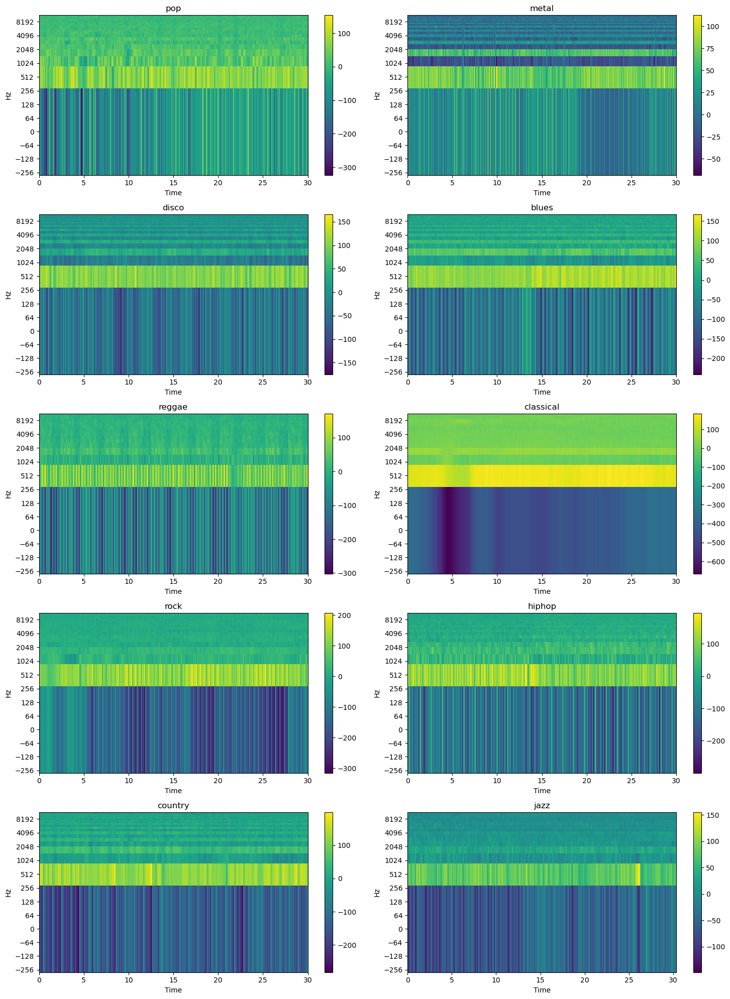

In [23]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    
    mfcc_data = librosa.feature.mfcc(y = signals[k], sr = sr)
    
    img = librosa.display.specshow(mfcc_data, sr = sr, x_axis = 'time', y_axis = 'log',cmap = 'viridis',ax=axes[i][j])
    fig.colorbar(img, ax=axes[i][j])
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Chroma

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


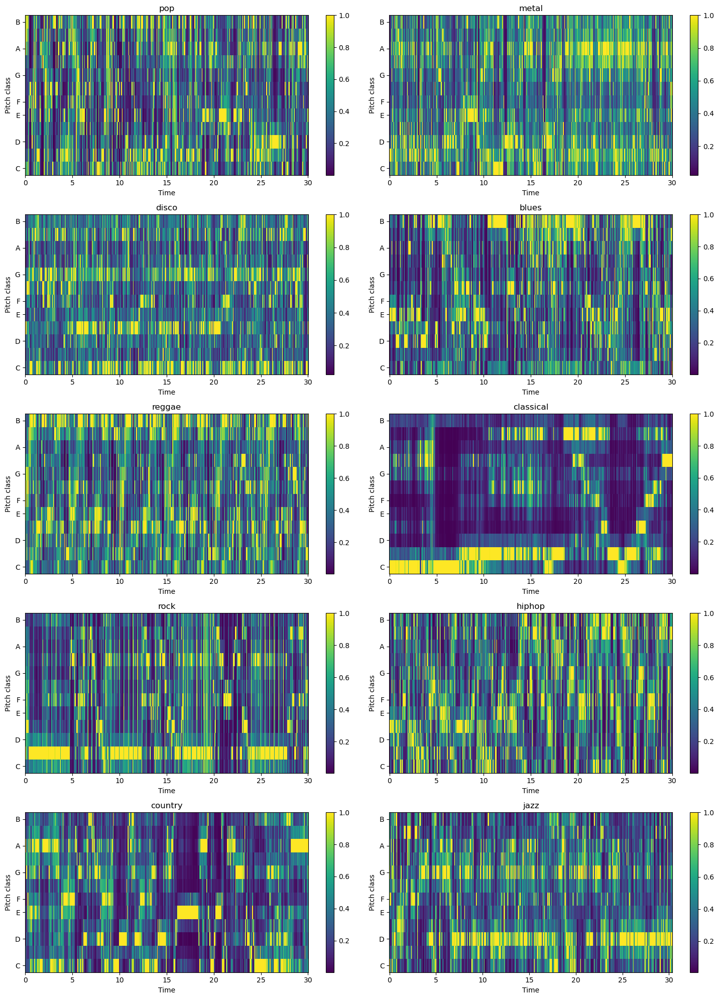

In [21]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    # Chromogram
    chromagram = librosa.feature.chroma_stft(y = signals[k], sr=sr, hop_length=hop_length)
    #print('Chromogram shape:', chromagram.shape)

    #plt.figure(figsize=(16, 6))
    img = librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='viridis',ax=axes[i][j])
    fig.colorbar(img, ax=axes[i][j])
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()


## Spectral Centroid

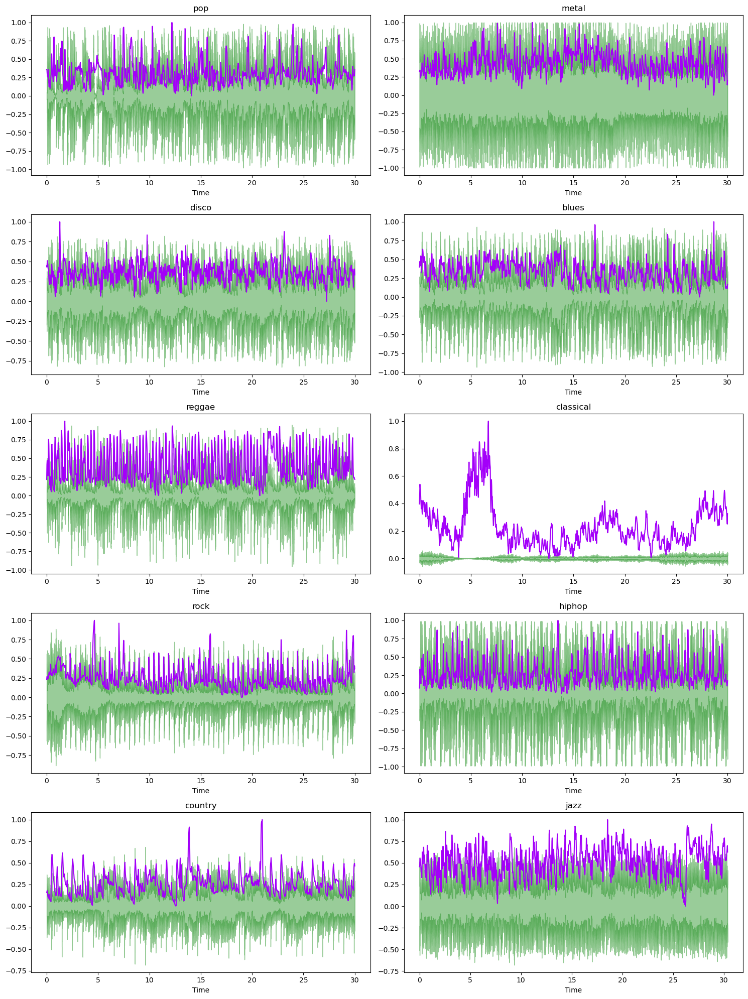

In [16]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0

for k in range(0, len(signals)):
    spectral_centroids = librosa.feature.spectral_centroid(y = signals[k], sr = sr)[0]
    
    # Computing the time variable for visualization
    frames = range(len(spectral_centroids))

    # Converts frame counts to time (seconds)
    t = librosa.frames_to_time(frames)
    
    librosa.display.waveshow(y = signals[k], sr=sr, alpha=0.4, color = 'green',ax=axes[i][j])

    axes[i][j].plot(t, minmax_scale(spectral_centroids, axis=0), color='#A300F9')
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Spectral Rolloff

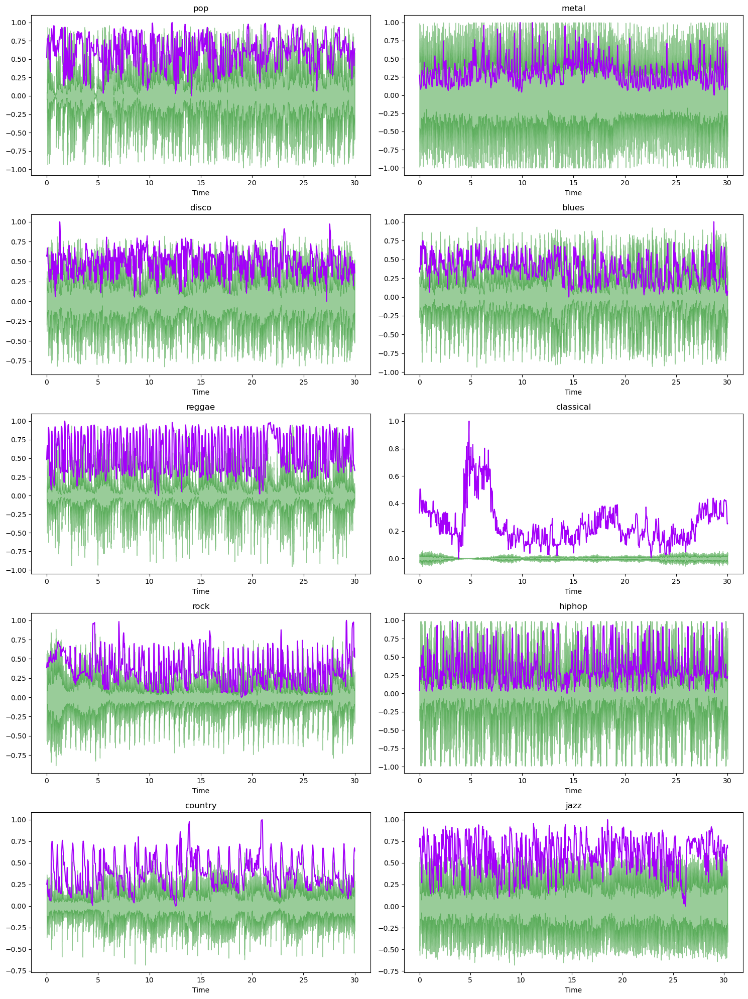

In [17]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for k in range(0, len(signals)):
    spectral_rolloff = librosa.feature.spectral_rolloff(y = signals[k], sr = sr)[0]
    
    # Computing the time variable for visualization
    frames = range(len(spectral_rolloff))

    # Converts frame counts to time (seconds)
    t = librosa.frames_to_time(frames)
    
    librosa.display.waveshow(signals[k], sr = sr, alpha=0.4, color = 'green',ax=axes[i][j])

    axes[i][j].plot(t, minmax_scale(spectral_rolloff, axis=0), color='#A300F9')
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

## Spectral Bandwith

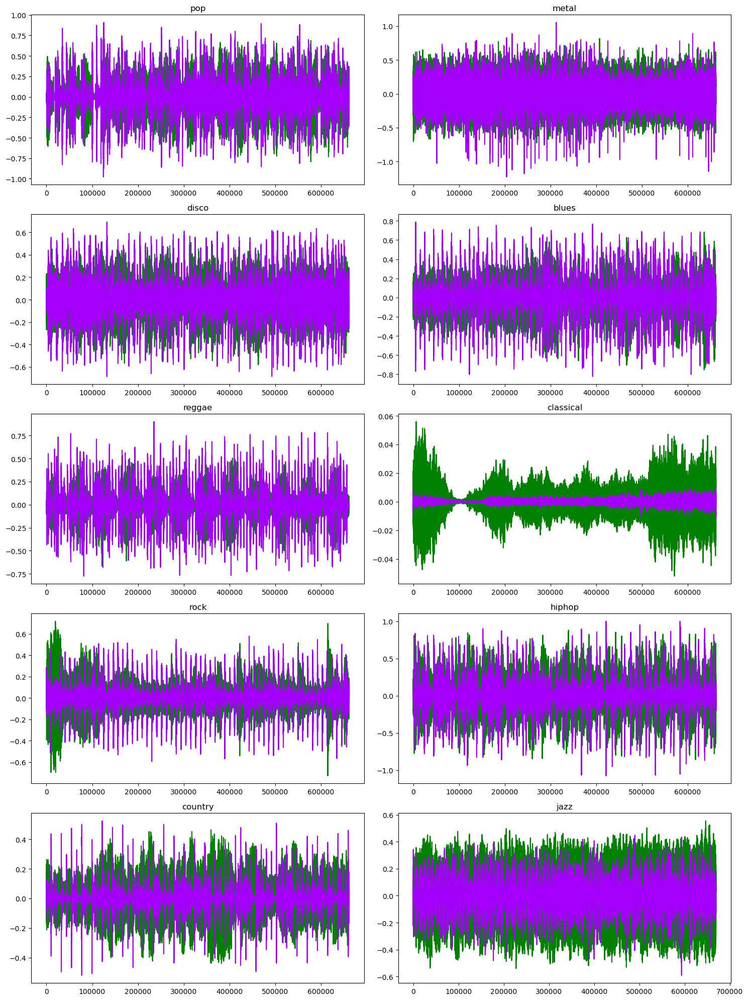

In [18]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0

for k in range(0, len(signals)):

    y_harm, y_perc = librosa.effects.hpss(signals[k])
    
    axes[i][j].plot(y_harm, color = 'green')
    
    axes[i][j].plot(y_perc, color = '#A300F9')
    
    axes[i][j].set_title(genres[k])

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

© Louis 2024